## Importing Libraries Loading Datase 

In [47]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
import plotly.express as px
import scipy.stats as stats
from sklearn.model_selection import cross_val_score

In [2]:
df=pd.read_csv('IMDb Movies India.csv',encoding='latin1')
df.head(10)

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
0,,NaN,NaN,Drama,NaN,NaN,J.S. Randhawa,Manmauji,Birbal,Rajendra Bhatia
1,#Gadhvi (He thought he was Gandhi),(2019),109 min,Drama,7.0,8,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid
2,#Homecoming,(2021),90 min,"Drama, Musical",NaN,NaN,Soumyajit Majumdar,Sayani Gupta,Plabita Borthakur,Roy Angana
3,#Yaaram,(2019),110 min,"Comedy, Romance",4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
4,...And Once Again,(2010),105 min,Drama,NaN,NaN,Amol Palekar,Rajat Kapoor,Rituparna Sengupta,Antara Mali
5,...Aur Pyaar Ho Gaya,(1997),147 min,"Comedy, Drama, Musical",4.7,827,Rahul Rawail,Bobby Deol,Aishwarya Rai Bachchan,Shammi Kapoor
6,...Yahaan,(2005),142 min,"Drama, Romance, War",7.4,"1,086",Shoojit Sircar,Jimmy Sheirgill,Minissha Lamba,Yashpal Sharma
7,.in for Motion,(2008),59 min,Documentary,NaN,NaN,Anirban Datta,NaN,NaN,NaN
8,?: A Question Mark,(2012),82 min,"Horror, Mystery, Thriller",5.6,326,Allyson Patel,Yash Dave,Muntazir Ahmad,Kiran Bhatia
9,@Andheri,(2014),116 min,"Action, Crime, Thriller",4.0,11,Biju Bhaskar Nair,Augustine,Fathima Babu,Byon


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15509 entries, 0 to 15508
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Name      15509 non-null  object 
 1   Year      14981 non-null  object 
 2   Duration  7240 non-null   object 
 3   Genre     13632 non-null  object 
 4   Rating    7919 non-null   float64
 5   Votes     7920 non-null   object 
 6   Director  14984 non-null  object 
 7   Actor 1   13892 non-null  object 
 8   Actor 2   13125 non-null  object 
 9   Actor 3   12365 non-null  object 
dtypes: float64(1), object(9)
memory usage: 1.2+ MB


In [4]:
df.columns

Index(['Name', 'Year', 'Duration', 'Genre', 'Rating', 'Votes', 'Director',
       'Actor 1', 'Actor 2', 'Actor 3'],
      dtype='object')

In [5]:
df.describe()


,Rating
count,7919.000000
mean,5.841621
std,1.381777
min,1.100000
25%,4.900000
50%,6.000000
75%,6.800000
max,10.000000


## Getting Information about Nan /  Missing Values

In [6]:
print("unique count")
print(df.nunique())
print("Null count")
df.isnull().sum()

unique count
Name        13838
Year          102
Duration      182
Genre         485
Rating         84
Votes        2034
Director     5938
Actor 1      4718
Actor 2      4891
Actor 3      4820
dtype: int64
Null count


Name           0
Year         528
Duration    8269
Genre       1877
Rating      7590
Votes       7589
Director     525
Actor 1     1617
Actor 2     2384
Actor 3     3144
dtype: int64

In [7]:
def missing_values_percent(dataframe):
    missing_values = dataframe.isna().sum()
    percentage_missing = (missing_values / len(dataframe) * 100).round(2)

    result_movie = pd.DataFrame({'Missing Values': missing_values, 'Percentage': percentage_missing})
    result_movie['Percentage'] = result_movie['Percentage'].astype(str) + '%'

    return result_movie


result = missing_values_percent(df)
result

,Missing Values,Percentage
Name,0,0.0%
Year,528,3.4%
Duration,8269,53.32%
Genre,1877,12.1%
Rating,7590,48.94%
Votes,7589,48.93%
Director,525,3.39%
Actor 1,1617,10.43%
Actor 2,2384,15.37%
Actor 3,3144,20.27%


<Axes: >

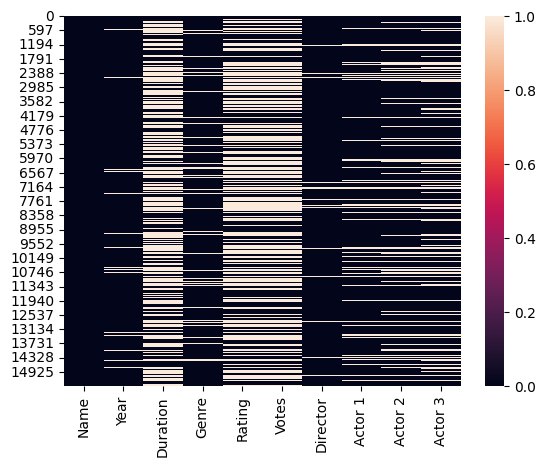

In [8]:
sns.heatmap(df.isnull())

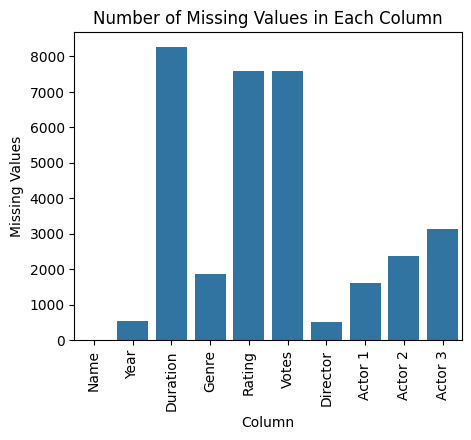

In [9]:
missing_values = df.isnull().sum()

# Convert the Series to a DataFrame for plotting
missing_values_df = missing_values.reset_index()
missing_values_df.columns = ['Column', 'Missing Values']

# Plot using seaborn's barplot
plt.figure(figsize=(5, 4))
sns.barplot(x='Column', y='Missing Values', data=missing_values_df)
plt.xticks(rotation=90)  # Rotate column names for better visibility
plt.title('Number of Missing Values in Each Column')
plt.show()

In [10]:
df['Rating'].fillna(df['Rating'].mean())

0        5.841621
1        7.000000
2        5.841621
3        4.400000
4        5.841621
           ...   
15504    4.600000
15505    4.500000
15506    5.841621
15507    5.841621
15508    6.200000
Name: Rating, Length: 15509, dtype: float64

## Correcting Data Formte of Columns

In [11]:
df=df.dropna(subset=['Year'],axis=0)
df['Year'].head()
df['Year'] = df['Year'].str.replace('(', '', regex=False).str.replace(')', '', regex=False).astype(int)

df.head()

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
1,#Gadhvi (He thought he was Gandhi),2019,109 min,Drama,7.0,8,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid
2,#Homecoming,2021,90 min,"Drama, Musical",NaN,NaN,Soumyajit Majumdar,Sayani Gupta,Plabita Borthakur,Roy Angana
3,#Yaaram,2019,110 min,"Comedy, Romance",4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
4,...And Once Again,2010,105 min,Drama,NaN,NaN,Amol Palekar,Rajat Kapoor,Rituparna Sengupta,Antara Mali
5,...Aur Pyaar Ho Gaya,1997,147 min,"Comedy, Drama, Musical",4.7,827,Rahul Rawail,Bobby Deol,Aishwarya Rai Bachchan,Shammi Kapoor


In [12]:
result = missing_values_percent(df)
result

,Missing Values,Percentage
Name,0,0.0%
Year,0,0.0%
Duration,7866,52.51%
Genre,1841,12.29%
Rating,7062,47.14%
Votes,7061,47.13%
Director,497,3.32%
Actor 1,1488,9.93%
Actor 2,2197,14.67%
Actor 3,2907,19.4%


In [13]:
df['Duration'] = df['Duration'].fillna('0').astype(str)

    # Remove ' min' from 'Duration'
df['Duration'] = df['Duration'].str.replace(' min', '')

    # Convert 'Duration' to integers
df['Duration'] = df['Duration'].astype(int)


## Filling the NAN values in Duration Column with the best Values 

In [14]:
print(max(df['Duration']))
print(min(df['Duration']))
print(np.mean(df['Duration']))
print(max(df['Duration']))

321
0
61.0137507509512
321


<Axes: xlabel='Duration'>

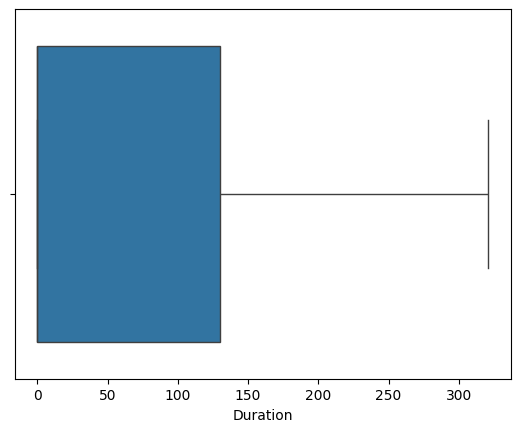

In [15]:
df['Duration']=df['Duration'].astype(int)
sns.boxplot(x=df['Duration'])


### Duration mainly depends on Genre , Actors name and Director

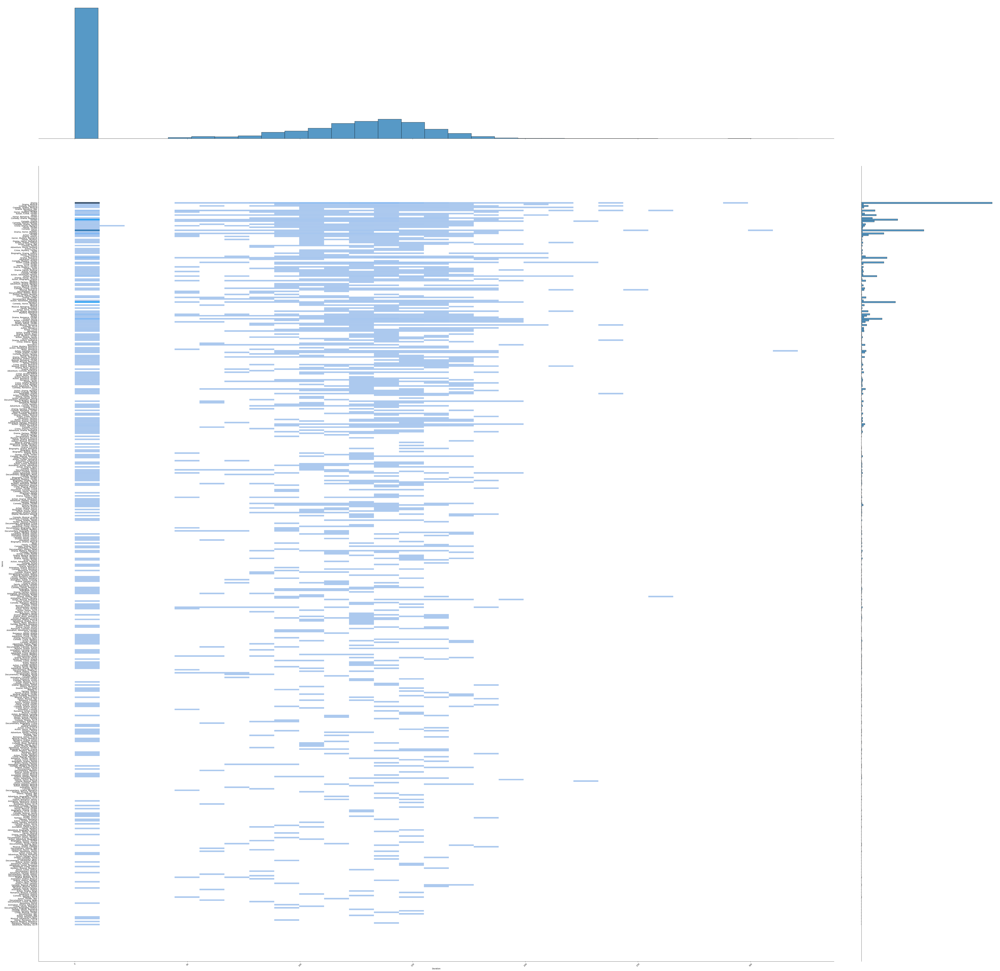

In [16]:
# plt.figure(figsize=(106, 10))
sns.jointplot(data=df, y='Genre', x='Duration',height=69,dropna=True,kind='hist')
plt.xticks(rotation=45)
plt.show()

### Filling Nan values of Duration by Relating with Genre ,Actor and Director

In [17]:
median_duration_by_genre = df.groupby('Genre')['Duration'].median()

# Display median duration by genre
print("\nMedian duration by genre:")
print(median_duration_by_genre)

# Debug: Print rows with Duration == 0 before replacement
print("\nRows with Duration == 0 before replacement:")
print(df[df['Duration'] == 0])

# Replace Duration == 0 with median duration by genre inplace
for genre, median_duration in median_duration_by_genre.items():
    df.loc[(df['Duration'] == 0) & (df['Genre'] == genre), 'Duration'] = median_duration

# Debug: Print rows with Duration == 0 after replacement
print("\nRows with Duration == 0 after replacement:")
print(df['Duration'].value_counts())


Median duration by genre:
Genre
Action                            0.0
Action, Adventure                 0.0
Action, Adventure, Biography    100.0
Action, Adventure, Comedy       141.0
Action, Adventure, Crime         93.0
                                ...  
Thriller, Action                 64.5
Thriller, Musical, Mystery      158.0
Thriller, Mystery               139.0
Thriller, Mystery, Family       142.0
War                             100.0
Name: Duration, Length: 474, dtype: float64

Rows with Duration == 0 before replacement:
                      Name  Year  Duration                   Genre  Rating  \
14              101 Ratein  1990         0                Thriller     NaN   
17         108 Teerthyatra  1987         0  Comedy, Drama, Fantasy     NaN   
19              11 O'Clock  1948         0                     NaN     NaN   
20              12 Bulbule  2021         0   Comedy, Drama, Family     NaN   
24                    124a  2021         0             Documentary    

C:\Users\DELL\AppData\Local\Temp\ipykernel_17764\3399968982.py:13: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '99.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[(df['Duration'] == 0) & (df['Genre'] == genre), 'Duration'] = median_duration



Rows with Duration == 0 after replacement:
Duration
0.0      6258
135.0     299
120.0     282
121.0     243
57.0      235
         ... 
298.0       1
217.0       1
64.5        1
250.0       1
141.5       1
Name: count, Length: 213, dtype: int64


In [18]:

median_duration_by_director = df.groupby('Director')['Duration'].median()

# Replace Duration == 0 with median duration by Director inplace
for director, median_duration in median_duration_by_director.items():
    df.loc[(df['Duration'] == 0) & (df['Director'] == director), 'Duration'] = median_duration

print("\nCount of each Duration value:")
print(df['Duration'].value_counts())


Count of each Duration value:
Duration
0.0      5002
135.0     345
120.0     307
121.0     292
133.0     257
         ... 
217.0       1
40.0        1
250.0       1
76.5        1
29.0        1
Name: count, Length: 295, dtype: int64


In [19]:
actors=['Actor 1','Actor 2',  'Actor 3']
for actor in actors:
    median_duration_by_actor = df.groupby(actor)['Duration'].median()

    for act, median_duration in median_duration_by_actor.items():
        df.loc[(df['Duration'] == 0) & (df[actor] == act), 'Duration'] = median_duration
    print(f"\nCount of each Duration value: when grouping by {actor}")
    print(df['Duration'].value_counts())


    



Count of each Duration value: when grouping by Actor 1
Duration
0.00      3893
135.00     368
120.00     328
133.00     315
121.00     313
          ... 
217.00       1
40.00        1
63.75        1
250.00       1
76.50        1
Name: count, Length: 346, dtype: int64

Count of each Duration value: when grouping by Actor 2
Duration
0.000      2920
135.000     381
121.000     347
120.000     342
133.000     320
           ... 
63.750        1
250.000       1
84.875        1
76.250        1
76.500        1
Name: count, Length: 391, dtype: int64

Count of each Duration value: when grouping by Actor 3
Duration
0.000      2316
121.000     405
135.000     384
120.000     344
133.000     327
           ... 
56.250        1
40.000        1
250.000       1
84.875        1
76.500        1
Name: count, Length: 432, dtype: int64


321


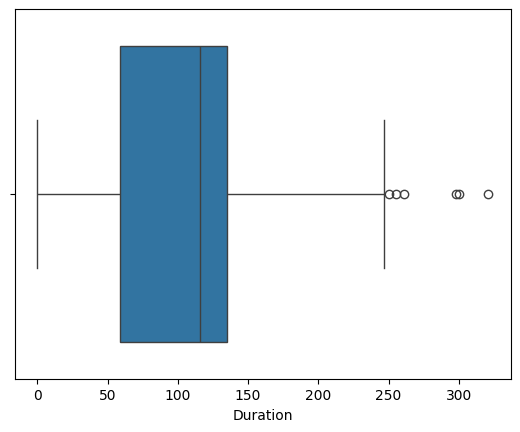

In [20]:
df['Duration']=df['Duration'].astype(int)
sns.boxplot(x=df['Duration'])
print(max(df['Duration']))

In [21]:
df=df.dropna(subset=['Duration'],axis=0)
df=df[df['Duration'] >= 60]
df.head()

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
1,#Gadhvi (He thought he was Gandhi),2019,109,Drama,7.0,8,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid
2,#Homecoming,2021,90,"Drama, Musical",NaN,NaN,Soumyajit Majumdar,Sayani Gupta,Plabita Borthakur,Roy Angana
3,#Yaaram,2019,110,"Comedy, Romance",4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
4,...And Once Again,2010,105,Drama,NaN,NaN,Amol Palekar,Rajat Kapoor,Rituparna Sengupta,Antara Mali
5,...Aur Pyaar Ho Gaya,1997,147,"Comedy, Drama, Musical",4.7,827,Rahul Rawail,Bobby Deol,Aishwarya Rai Bachchan,Shammi Kapoor


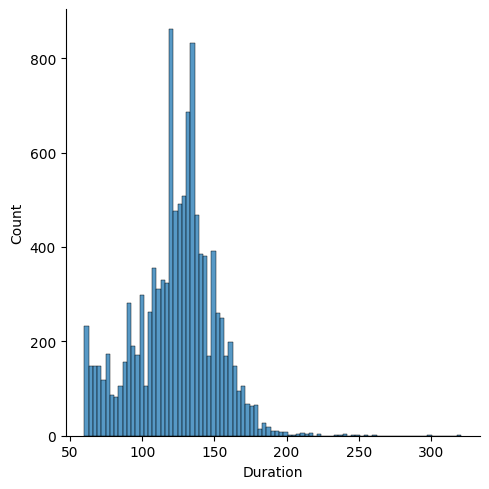

In [22]:
sns.displot(df['Duration'])

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11220 entries, 1 to 15508
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Name      11220 non-null  object 
 1   Year      11220 non-null  int64  
 2   Duration  11220 non-null  int64  
 3   Genre     10451 non-null  object 
 4   Rating    7525 non-null   float64
 5   Votes     7525 non-null   object 
 6   Director  11207 non-null  object 
 7   Actor 1   10912 non-null  object 
 8   Actor 2   10695 non-null  object 
 9   Actor 3   10371 non-null  object 
dtypes: float64(1), int64(2), object(7)
memory usage: 964.2+ KB


## Checking remaining Nan Values

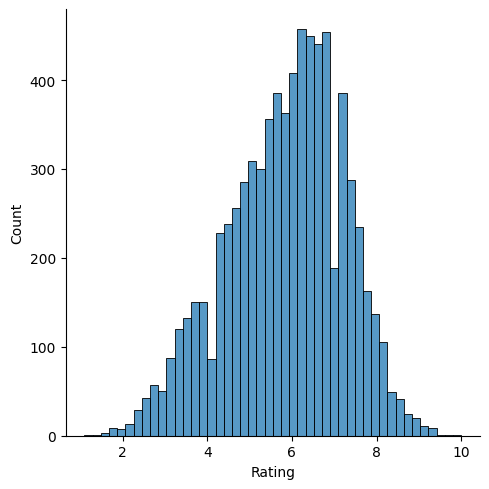

In [24]:
sns.displot(df['Rating'])


In [25]:
df=df.dropna(subset=['Rating'],axis=0)
result = missing_values_percent(df)
result

,Missing Values,Percentage
Name,0,0.0%
Year,0,0.0%
Duration,0,0.0%
Genre,65,0.86%
Rating,0,0.0%
Votes,0,0.0%
Director,1,0.01%
Actor 1,76,1.01%
Actor 2,124,1.65%
Actor 3,189,2.51%


In [26]:
df["Director"]=df["Director"].fillna('Dilip Bose')

result = missing_values_percent(df)
result

,Missing Values,Percentage
Name,0,0.0%
Year,0,0.0%
Duration,0,0.0%
Genre,65,0.86%
Rating,0,0.0%
Votes,0,0.0%
Director,0,0.0%
Actor 1,76,1.01%
Actor 2,124,1.65%
Actor 3,189,2.51%


## Exploding Genre column for better fitting of model and filling NAN values with mode of genre

In [27]:

df['Genre'] = df['Genre'].str.split(', ')
df = df.explode('Genre')
df['Genre'].fillna(df['Genre'].mode()[0], inplace=True)
df.head()

C:\Users\DELL\AppData\Local\Temp\ipykernel_17764\4272183703.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Genre'].fillna(df['Genre'].mode()[0], inplace=True)


,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
1,#Gadhvi (He thought he was Gandhi),2019,109,Drama,7.0,8,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid
3,#Yaaram,2019,110,Comedy,4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
3,#Yaaram,2019,110,Romance,4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
5,...Aur Pyaar Ho Gaya,1997,147,Comedy,4.7,827,Rahul Rawail,Bobby Deol,Aishwarya Rai Bachchan,Shammi Kapoor
5,...Aur Pyaar Ho Gaya,1997,147,Drama,4.7,827,Rahul Rawail,Bobby Deol,Aishwarya Rai Bachchan,Shammi Kapoor


In [28]:
df=df.dropna(subset=['Actor 1','Actor 2','Actor 3'],axis=0)
result = missing_values_percent(df)
result
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15074 entries, 1 to 15508
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Name      15074 non-null  object 
 1   Year      15074 non-null  int64  
 2   Duration  15074 non-null  int64  
 3   Genre     15074 non-null  object 
 4   Rating    15074 non-null  float64
 5   Votes     15074 non-null  object 
 6   Director  15074 non-null  object 
 7   Actor 1   15074 non-null  object 
 8   Actor 2   15074 non-null  object 
 9   Actor 3   15074 non-null  object 
dtypes: float64(1), int64(2), object(7)
memory usage: 1.3+ MB


## Correcting Votes Column

In [29]:

df['Votes'] = df['Votes'].str.replace(',', '', regex=False).astype(int)

In [30]:
df.head(10)

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
1,#Gadhvi (He thought he was Gandhi),2019,109,Drama,7.0,8,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid
3,#Yaaram,2019,110,Comedy,4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
3,#Yaaram,2019,110,Romance,4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
5,...Aur Pyaar Ho Gaya,1997,147,Comedy,4.7,827,Rahul Rawail,Bobby Deol,Aishwarya Rai Bachchan,Shammi Kapoor
5,...Aur Pyaar Ho Gaya,1997,147,Drama,4.7,827,Rahul Rawail,Bobby Deol,Aishwarya Rai Bachchan,Shammi Kapoor
5,...Aur Pyaar Ho Gaya,1997,147,Musical,4.7,827,Rahul Rawail,Bobby Deol,Aishwarya Rai Bachchan,Shammi Kapoor
6,...Yahaan,2005,142,Drama,7.4,1086,Shoojit Sircar,Jimmy Sheirgill,Minissha Lamba,Yashpal Sharma
6,...Yahaan,2005,142,Romance,7.4,1086,Shoojit Sircar,Jimmy Sheirgill,Minissha Lamba,Yashpal Sharma
6,...Yahaan,2005,142,War,7.4,1086,Shoojit Sircar,Jimmy Sheirgill,Minissha Lamba,Yashpal Sharma
8,?: A Question Mark,2012,82,Horror,5.6,326,Allyson Patel,Yash Dave,Muntazir Ahmad,Kiran Bhatia


## Visualising the relationship b/w different columns


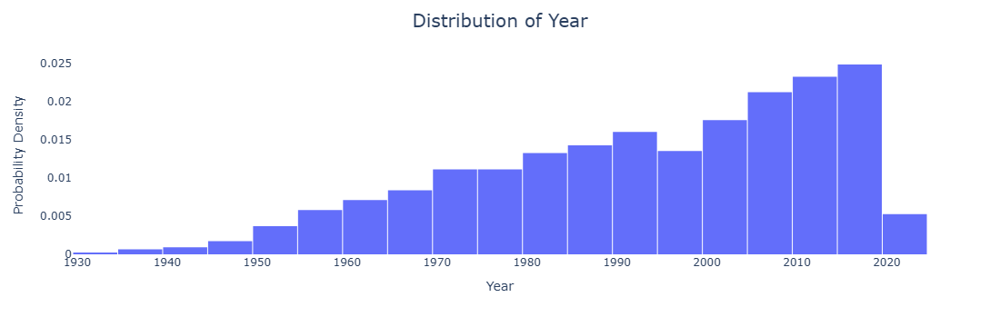

In [31]:



fig_year = px.histogram(df, x='Year', histnorm='probability density', nbins=30)
fig_year.update_traces(selector=dict(type='histogram'))
fig_year.update_layout(
    title='Distribution of Year',
    title_x=0.5,
    title_pad=dict(t=20),
    title_font=dict(size=20),
    xaxis_title='Year',
    yaxis_title='Probability Density',
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=False),
    bargap=0.02,
    plot_bgcolor='white'
)

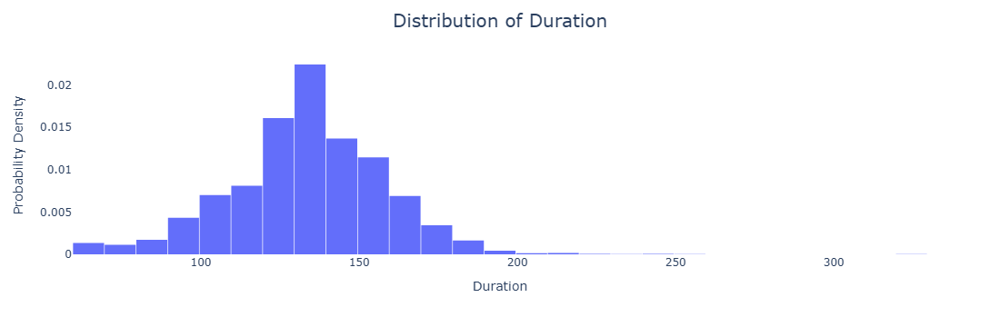

In [32]:
fig_dur = px.histogram(df, x = 'Duration', histnorm='probability density', nbins = 40)
fig_dur.update_traces(selector=dict(type='histogram'))
fig_dur.update_layout(
    title='Distribution of Duration', 
    title_x=0.5, title_pad=dict(t=20),
    title_font=dict(size=20), xaxis_title='Duration',
    yaxis_title='Probability Density',
    xaxis=dict(showgrid=False), 
    yaxis=dict(showgrid=False),
    bargap=0.02, 
    plot_bgcolor = 'white')
fig_dur.show()

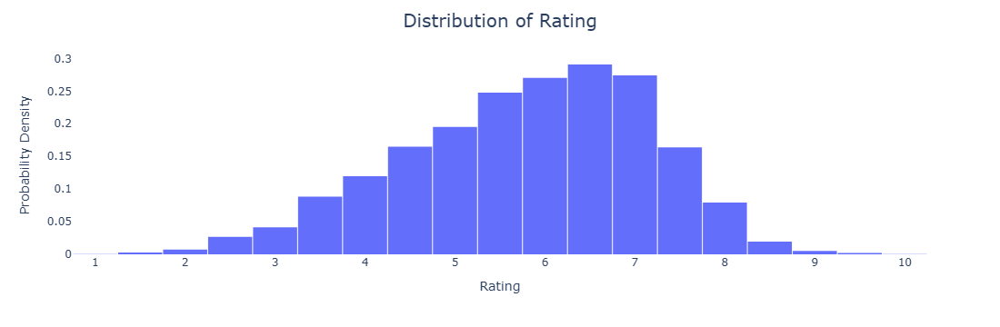

In [33]:
fig_rat = px.histogram(df, x = 'Rating', histnorm='probability density', nbins = 40)
fig_rat.update_traces(selector=dict(type='histogram'))
fig_rat.update_layout(title='Distribution of Rating', 
                      title_x=0.5, 
                      title_pad=dict(t=20),
                      title_font=dict(size=20),
                      xaxis_title='Rating',
                      yaxis_title='Probability Density',
                      xaxis=dict(showgrid=False),
                      yaxis=dict(showgrid=False),
                      bargap=0.02,
                      plot_bgcolor = 'white')
fig_rat.show()

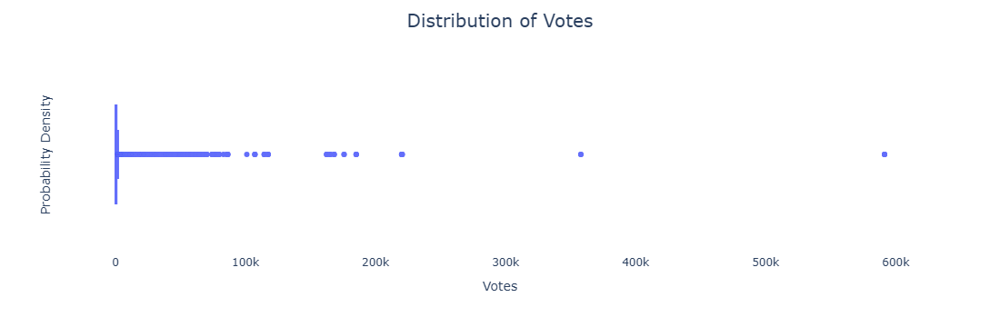

In [34]:
fig_vot = px.box(df, x = 'Votes')
fig_vot.update_layout(title='Distribution of Votes', 
                        title_x=0.5,
                        title_pad=dict(t=20), 
                        title_font=dict(size=20),
                        xaxis_title='Votes',
                        yaxis_title='Probability Density', 
                        xaxis=dict(showgrid=False), 
                        yaxis=dict(showgrid=False), 
                        plot_bgcolor = 'white')
fig_vot.show()

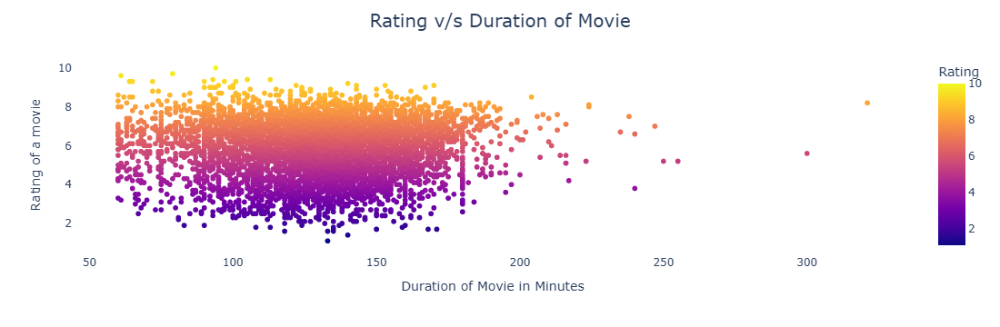

In [35]:
rel_dur_rat = px.scatter(df, x = 'Duration', y = 'Rating', color = "Rating")
rel_dur_rat.update_layout(title='Rating v/s Duration of Movie',
                          title_x=0.5,
                          title_pad=dict(t=20),
                          title_font=dict(size=20),
                          xaxis_title='Duration of Movie in Minutes',
                          yaxis_title='Rating of a movie',
                          xaxis=dict(showgrid=False), 
                          yaxis=dict(showgrid=False),
                          plot_bgcolor = 'white')
rel_dur_rat.show()

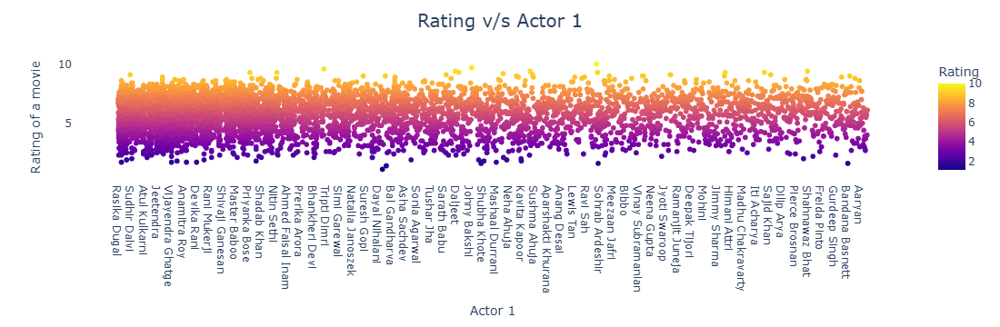

In [36]:
rel_dur_rat = px.scatter(df, x = 'Actor 1', y = 'Rating', color = "Rating")
rel_dur_rat.update_layout(title='Rating v/s Actor 1',
                          title_x=0.5,
                          title_pad=dict(t=20),
                          title_font=dict(size=20),
                          xaxis_title='Actor 1',
                          yaxis_title='Rating of a movie',
                          xaxis=dict(showgrid=False), 
                          yaxis=dict(showgrid=False),
                          plot_bgcolor = 'white')
rel_dur_rat.show()

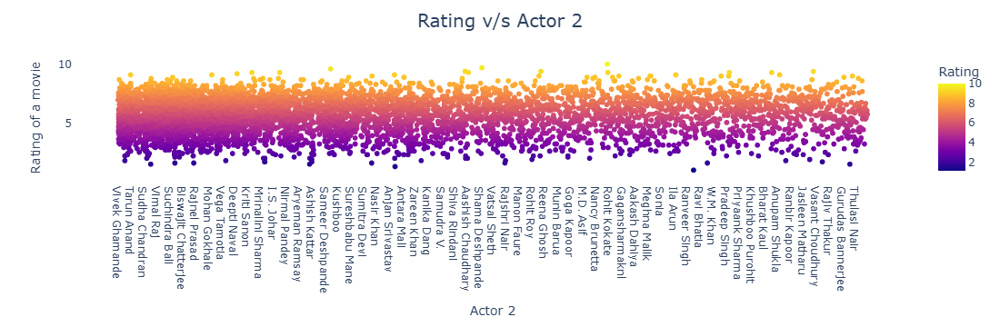

In [37]:
rel_dur_rat = px.scatter(df, x = 'Actor 2', y = 'Rating', color = "Rating")
rel_dur_rat.update_layout(title='Rating v/s Actor 2',
                          title_x=0.5,
                          title_pad=dict(t=20),
                          title_font=dict(size=20),
                          xaxis_title='Actor 2',
                          yaxis_title='Rating of a movie',
                          xaxis=dict(showgrid=False), 
                          yaxis=dict(showgrid=False),
                          plot_bgcolor = 'white')
rel_dur_rat.show()

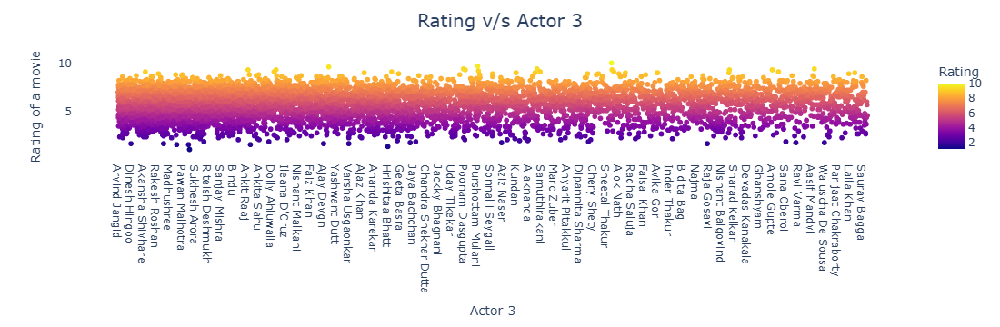

In [38]:
rel_dur_rat = px.scatter(df, x = 'Actor 3', y = 'Rating', color = "Rating")
rel_dur_rat.update_layout(title='Rating v/s Actor 3',
                          title_x=0.5,
                          title_pad=dict(t=20),
                          title_font=dict(size=20),
                          xaxis_title='Actor 3',
                          yaxis_title='Rating of a movie',
                          xaxis=dict(showgrid=False), 
                          yaxis=dict(showgrid=False),
                          plot_bgcolor = 'white')
rel_dur_rat.show()

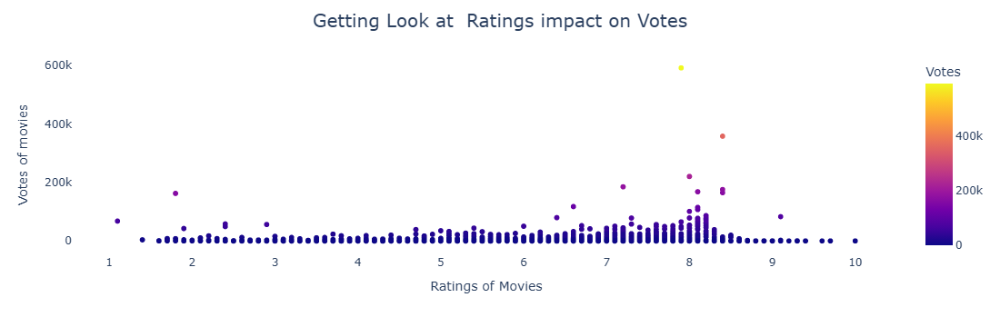

In [39]:
fig_rat_votes = px.scatter(df, x = 'Rating', y = 'Votes', color = "Votes")
fig_rat_votes.update_layout(title='Getting Look at  Ratings impact on Votes ',
                            title_x=0.5, 
                            title_pad=dict(t=20), 
                            title_font=dict(size=20), 
                            xaxis_title='Ratings of Movies', 
                            yaxis_title='Votes of movies', 
                            xaxis=dict(showgrid=False), 
                            yaxis=dict(showgrid=False),
                            plot_bgcolor = 'white')
fig_rat_votes.show()


In [40]:
df.drop('Name', axis = 1, inplace = True)

## Feature Engineering 

In [41]:

g_mean_rat = df.groupby('Genre')['Rating'].transform('mean')
df['G_mean_rat'] = g_mean_rat

dir_mean_rat = df.groupby('Director')['Rating'].transform('mean')
df['Dir_enc'] = dir_mean_rat

a1_mean_rat = df.groupby('Actor 1')['Rating'].transform('mean')
df['A1_enc'] = a1_mean_rat

a2_mean_rat = df.groupby('Actor 2')['Rating'].transform('mean')
df['A2_enc'] = a2_mean_rat

a3_mean_rat = df.groupby('Actor 3')['Rating'].transform('mean')
df['A3_enc'] = a3_mean_rat

In [42]:
df.head(10)

,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3,G_mean_rat,Dir_enc,A1_enc,A2_enc,A3_enc
1,2019,109,Drama,7.0,8,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid,5.987941,7.000000,6.850000,7.0000,7.000000
3,2019,110,Comedy,4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor,5.726592,4.400000,5.250000,4.4000,4.460000
3,2019,110,Romance,4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor,5.749141,4.400000,5.250000,4.4000,4.460000
5,1997,147,Comedy,4.7,827,Rahul Rawail,Bobby Deol,Aishwarya Rai Bachchan,Shammi Kapoor,5.726592,5.342105,4.793617,5.7300,5.930000
5,1997,147,Drama,4.7,827,Rahul Rawail,Bobby Deol,Aishwarya Rai Bachchan,Shammi Kapoor,5.987941,5.342105,4.793617,5.7300,5.930000
5,1997,147,Musical,4.7,827,Rahul Rawail,Bobby Deol,Aishwarya Rai Bachchan,Shammi Kapoor,6.167078,5.342105,4.793617,5.7300,5.930000
6,2005,142,Drama,7.4,1086,Shoojit Sircar,Jimmy Sheirgill,Minissha Lamba,Yashpal Sharma,5.987941,7.547059,5.322951,5.8000,6.671429
6,2005,142,Romance,7.4,1086,Shoojit Sircar,Jimmy Sheirgill,Minissha Lamba,Yashpal Sharma,5.749141,7.547059,5.322951,5.8000,6.671429
6,2005,142,War,7.4,1086,Shoojit Sircar,Jimmy Sheirgill,Minissha Lamba,Yashpal Sharma,5.981818,7.547059,5.322951,5.8000,6.671429
8,2012,82,Horror,5.6,326,Allyson Patel,Yash Dave,Muntazir Ahmad,Kiran Bhatia,4.776562,5.600000,5.600000,5.8125,5.600000


## Splitng Data

In [43]:
X = df[['Year', 'Votes', 'Duration', 'G_mean_rat', 'Dir_enc', 'A1_enc', 'A2_enc', 'A3_enc']]
y = df['Rating']
print(X.shape)
print(y.shape)

(15074, 8)
(15074,)


In [44]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.1,random_state=2)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)
X_train.info()

(13566, 8)
(13566,)
(1508, 8)
(1508,)
<class 'pandas.core.frame.DataFrame'>
Index: 13566 entries, 7839 to 7320
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Year        13566 non-null  int64  
 1   Votes       13566 non-null  int64  
 2   Duration    13566 non-null  int64  
 3   G_mean_rat  13566 non-null  float64
 4   Dir_enc     13566 non-null  float64
 5   A1_enc      13566 non-null  float64
 6   A2_enc      13566 non-null  float64
 7   A3_enc      13566 non-null  float64
dtypes: float64(5), int64(3)
memory usage: 953.9 KB


## Models Used :
 - ## Linear Regression
 - ## decision Tree Regressor
 - ## Random Forest Regressor
## Techniques used for Varification Of data 
 - ## R2 Score
 - ## K-Fold cross-
 - ## Mean squared error
 - ## Mean absolute error:

## Applying Linear Regression  and Predicting

In [45]:
lr = LinearRegression()
lr.fit(X_train,y_train)
lr_pred = lr.predict(X_test)

### Using R2 score and K-fold cross-validation for prediction of result 

In [48]:
print('The performance evaluation of Linear Regression is below:')
print('Mean squared error:', metrics.mean_squared_error(y_test, lr_pred))
print('Mean absolute error:', metrics.mean_absolute_error(y_test, lr_pred))
print('R2 score:', metrics.r2_score(y_test, lr_pred))
print('\n', '='*100, '\n')

# Perform 5-fold cross-validation for Linear Regression
cv_scores_lr = cross_val_score(lr, X, y, cv=8, scoring='r2')
print('Linear Regression 5-fold cross-validation R2 scores:', cv_scores_lr)
print('Mean R2 score:', cv_scores_lr.mean())

The performance evaluation of Linear Regression is below:
Mean squared error: 0.4140951393205695
Mean absolute error: 0.47974855335269573
R2 score: 0.758133677132174


Linear Regression 5-fold cross-validation R2 scores: [0.74580968 0.7178191  0.75935159 0.7381327  0.76971803 0.74521424
 0.71236289 0.7704389 ]
Mean R2 score: 0.7448558901375664


## Applying  Decision Tree Regressor  and Predicting

In [49]:
dt_regressor = DecisionTreeRegressor(random_state=2)
dt_regressor.fit(X_train, y_train)
y_pred = dt_regressor.predict(X_test)

### Using R2 score and K-fold cross-validation for prediction of result

In [50]:
print('The performance evaluation of Decision Tree Regressor is below:')
print('Mean squared error:', metrics.mean_squared_error(y_test, y_pred))
print('Mean absolute error:', metrics.mean_absolute_error(y_test, y_pred))
print('R2 score:', metrics.r2_score(y_test, y_pred))

# Perform 5-fold cross-validation for Decision Tree Regressor
cv_scores_dt = cross_val_score(dt_regressor, X, y, cv=8, scoring='r2')
print('\nDecision Tree Regressor 5-fold cross-validation R2 scores:', cv_scores_dt)
print('Mean R2 score:', cv_scores_dt.mean())

The performance evaluation of Decision Tree Regressor is below:
Mean squared error: 0.09157824933687002
Mean absolute error: 0.09031830238726801
R2 score: 0.9465106147874037

Decision Tree Regressor 5-fold cross-validation R2 scores: [0.51989674 0.53861423 0.55166213 0.56860252 0.59365443 0.55561806
 0.55839896 0.60298134]
Mean R2 score: 0.5611785495019856


## Applying Random Forest Regressor and Predicting

In [51]:
rf = RandomForestRegressor()
rf.fit(X_train,y_train)
rf_pred = rf.predict(X_test)

### Using R2 score and K-fold cross-validation for prediction of result


In [52]:
print('The performance evaluation of Random Forest Regressor is below:')
print('Mean squared error:', metrics.mean_squared_error(y_test, rf_pred))
print('Mean absolute error:', metrics.mean_absolute_error(y_test, rf_pred))
print('R2 score:', metrics.r2_score(y_test, rf_pred))

# Perform 5-fold cross-validation for Random Forest Regressor
cv_scores_rf = cross_val_score(rf, X, y, cv=8, scoring='r2')
print('\nRandom Forest Regressor 5-fold cross-validation R2 scores:', cv_scores_rf)
print('Mean R2 score:', cv_scores_rf.mean())

The performance evaluation of Random Forest Regressor is below:
Mean squared error: 0.07785447347480105
Mean absolute error: 0.15976392572944306
R2 score: 0.9545264519427662

Random Forest Regressor 5-fold cross-validation R2 scores: [0.78602018 0.74333073 0.78809587 0.79215352 0.82415772 0.79486869
 0.74669331 0.8099746 ]
Mean R2 score: 0.7856618267020112


## Standardization  Of Data 

In [53]:
Featured_df = df.copy()
Featured_df.to_csv('Featured_df.csv', index=False)

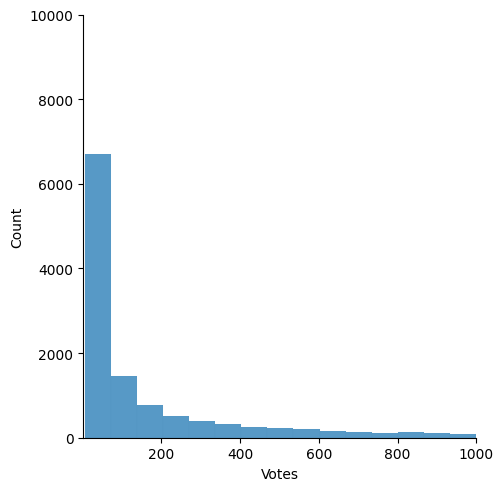

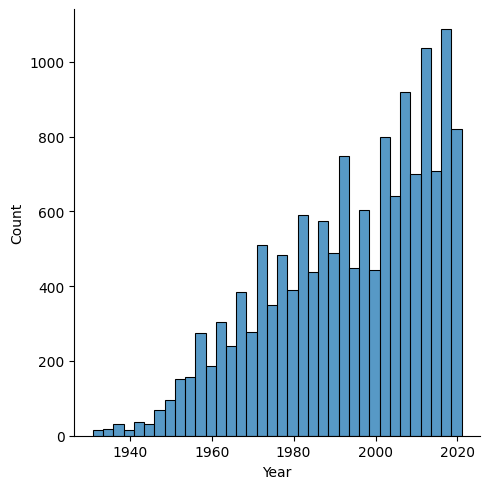

In [54]:
sns.displot(df['Votes'])
plt.xlim(1, 1000)  
plt.ylim(0, 10000) 
plt.show()
sns.displot(df['Year'])

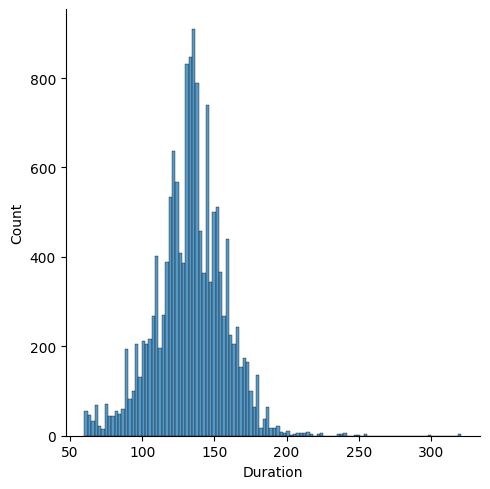

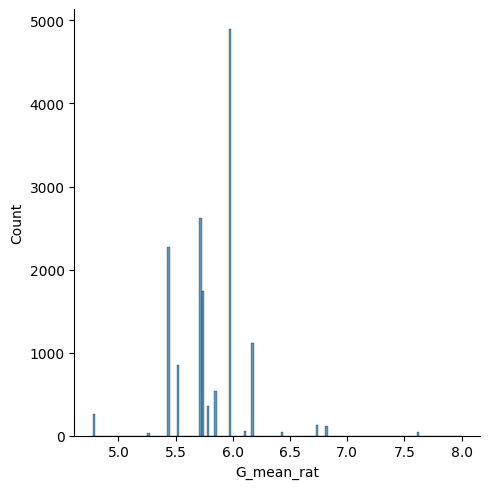

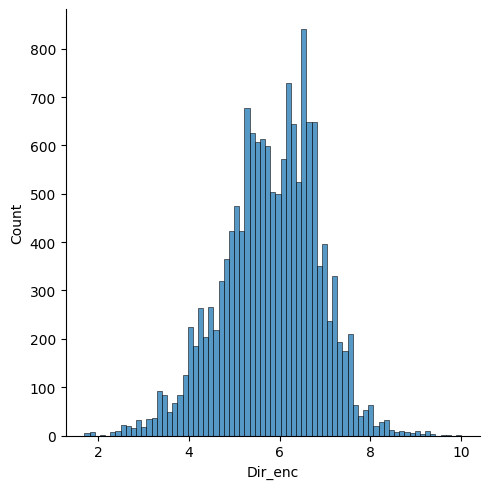

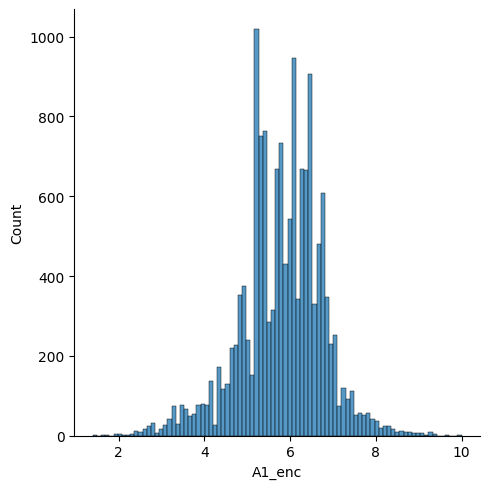

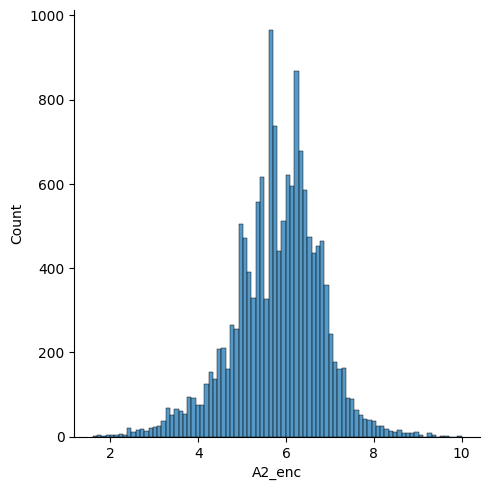

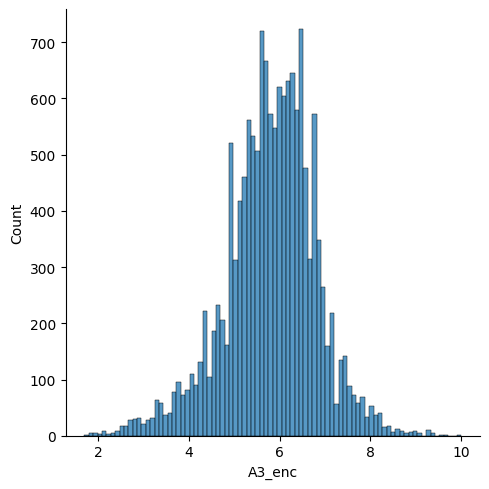

In [55]:
xol=[ 'Duration', 'G_mean_rat', 'Dir_enc', 'A1_enc', 'A2_enc', 'A3_enc']
for x in xol:
    sns.displot(df[x])

### Applying mean normalization on data which have Gaussion Distribtion and Min max Scaler on other which dont have so as to protect their relation with output

In [56]:
scaler=StandardScaler()
x_scaled=scaler.fit_transform(df[['Duration', 'G_mean_rat', 'Dir_enc', 'A1_enc', 'A2_enc', 'A3_enc']])
std_df=pd.DataFrame(columns=[ 'Duration', 'G_mean_rat', 'Dir_enc', 'A1_enc', 'A2_enc', 'A3_enc'],data=x_scaled)
minmax=MinMaxScaler()
x_minmax=minmax.fit_transform(df[['Year','Votes']])
minmax_df = pd.DataFrame(data=x_minmax, columns=['Year', 'Votes'])
scaled_df = pd.concat([std_df, minmax_df], axis=1)
scaled_df.head()

,Duration,G_mean_rat,Dir_enc,A1_enc,A2_enc,A3_enc,Year,Votes
0,-0.992384,0.599667,1.129951,1.070762,1.204433,1.186219,0.977778,0.000005
1,-0.951469,-0.260612,-1.330095,-0.569883,-1.417770,-1.336731,0.977778,0.000051
2,-0.951469,-0.186389,-1.330095,-0.569883,-1.417770,-1.336731,0.977778,0.000051
3,0.562401,-0.260612,-0.438702,-1.037860,-0.076412,0.123401,0.733333,0.001390
4,0.562401,0.599667,-0.438702,-1.037860,-0.076412,0.123401,0.733333,0.001390


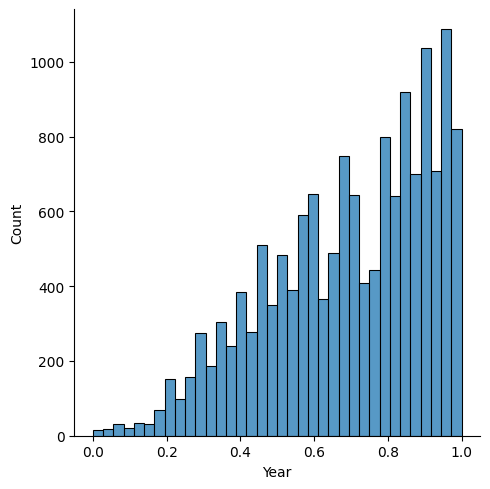

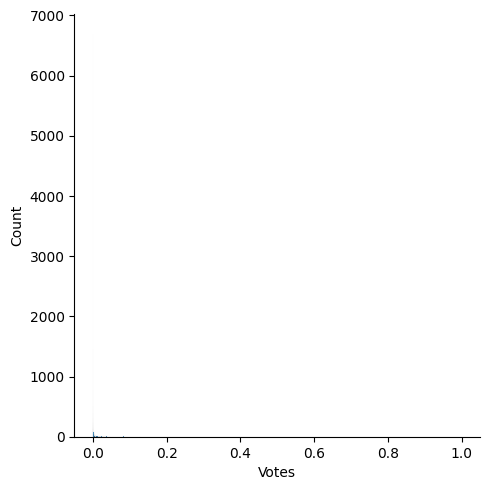

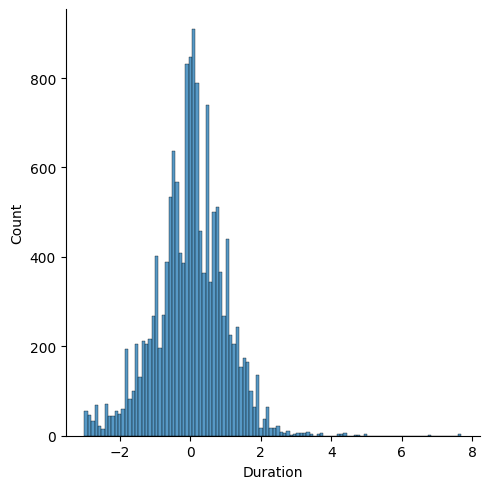

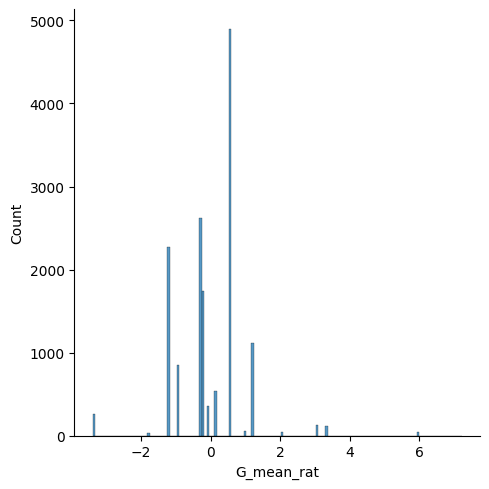

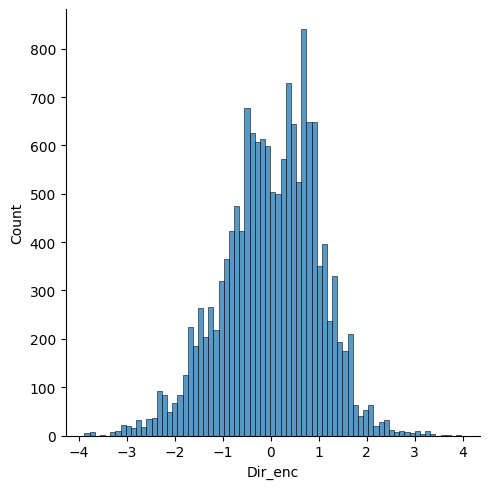

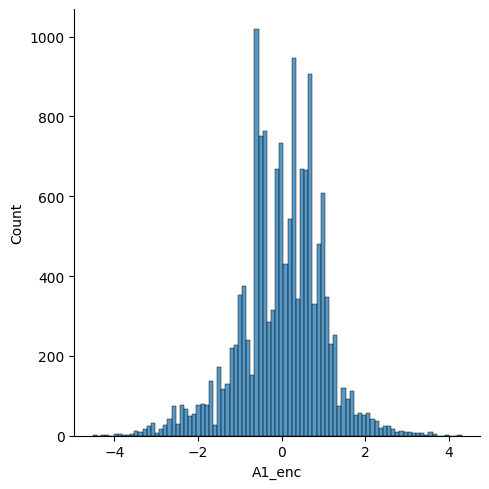

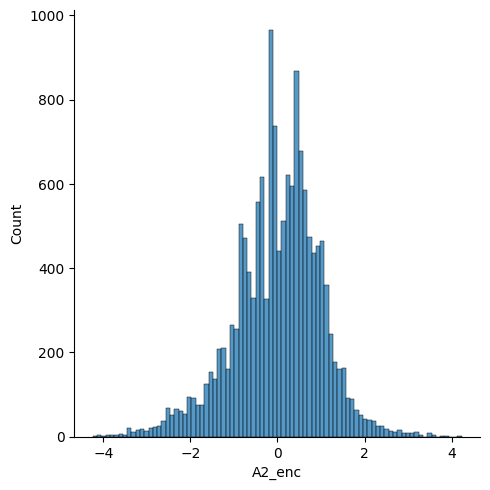

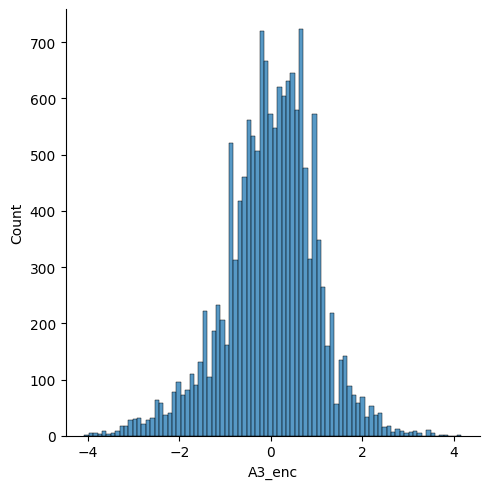

In [57]:
xol=['Year','Votes', 'Duration', 'G_mean_rat', 'Dir_enc', 'A1_enc', 'A2_enc', 'A3_enc']
for x in xol:
    sns.displot(scaled_df[x])

In [58]:
X = df[['Year', 'Votes', 'Duration', 'G_mean_rat', 'Dir_enc', 'A1_enc', 'A2_enc', 'A3_enc']]
y=df['Rating']

In [59]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.1,random_state=2)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)
X_train.info()

(13566, 8)
(13566,)
(1508, 8)
(1508,)
<class 'pandas.core.frame.DataFrame'>
Index: 13566 entries, 7839 to 7320
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Year        13566 non-null  int64  
 1   Votes       13566 non-null  int64  
 2   Duration    13566 non-null  int64  
 3   G_mean_rat  13566 non-null  float64
 4   Dir_enc     13566 non-null  float64
 5   A1_enc      13566 non-null  float64
 6   A2_enc      13566 non-null  float64
 7   A3_enc      13566 non-null  float64
dtypes: float64(5), int64(3)
memory usage: 953.9 KB


## Applying Linear Regression and Predicting

In [60]:
lr = LinearRegression()
lr.fit(X_train,y_train)
lr_pred = lr.predict(X_test)

### Using R2 score and K-fold cross-validation for prediction of result

In [61]:
print('The performance evaluation of Linear Regression is below:')
print('Mean squared error:', metrics.mean_squared_error(y_test, lr_pred))
print('Mean absolute error:', metrics.mean_absolute_error(y_test, lr_pred))
print('R2 score:', metrics.r2_score(y_test, lr_pred))
print('\n', '='*100, '\n')

# Perform 5-fold cross-validation for Linear Regression
cv_scores_lr = cross_val_score(lr, X, y, cv=8, scoring='r2')
print('Linear Regression 5-fold cross-validation R2 scores:', cv_scores_lr)
print('Mean R2 score:', cv_scores_lr.mean())

The performance evaluation of Linear Regression is below:
Mean squared error: 0.4140951393205695
Mean absolute error: 0.47974855335269573
R2 score: 0.758133677132174


Linear Regression 5-fold cross-validation R2 scores: [0.74580968 0.7178191  0.75935159 0.7381327  0.76971803 0.74521424
 0.71236289 0.7704389 ]
Mean R2 score: 0.7448558901375664


## Applying Decision Tree Regressor and Predicting


In [62]:
dt_regressor = DecisionTreeRegressor(random_state=2)
dt_regressor.fit(X_train, y_train)
y_pred = dt_regressor.predict(X_test)


### Using R2 score and K-fold cross-validation for prediction of result

In [63]:
print('The performance evaluation of Decision Tree Regressor is below: ', '\n')
print('Mean squared error: ', metrics.mean_squared_error(y_test, y_pred))
print('Mean absolute error: ', metrics.mean_absolute_error(y_test, y_pred))
print('R2 score: ', metrics.r2_score(y_test, y_pred))
cv_scores_dt = cross_val_score(dt_regressor, X, y, cv=8, scoring='r2')
print('\nDecision Tree Regressor 5-fold cross-validation R2 scores:', cv_scores_dt)
print('Mean R2 score:', cv_scores_dt.mean())

The performance evaluation of Decision Tree Regressor is below:  

Mean squared error:  0.09157824933687002
Mean absolute error:  0.09031830238726801
R2 score:  0.9465106147874037

Decision Tree Regressor 5-fold cross-validation R2 scores: [0.51989674 0.53861423 0.55166213 0.56860252 0.59365443 0.55561806
 0.55839896 0.60298134]
Mean R2 score: 0.5611785495019856


## Applying Random Forest Regressor and Predicting


In [64]:
rf = RandomForestRegressor()
rf.fit(X_train,y_train)
rf_pred = rf.predict(X_test)

### Using R2 score and K-fold cross-validation for prediction result

In [65]:
print('The performance evaluation of Random Forest Regressor is below: ', '\n')
print('Mean squared error: ',metrics.mean_squared_error(y_test, rf_pred))
print('Mean absolute error: ',metrics.mean_absolute_error(y_test, rf_pred))
print('R2 score: ',metrics.r2_score(y_test, rf_pred))
cv_scores_rf = cross_val_score(rf, X, y, cv=8, scoring='r2')
print('\nRandom Forest Regressor 5-fold cross-validation R2 scores:', cv_scores_rf)
print('Mean R2 score:', cv_scores_rf.mean())

The performance evaluation of Random Forest Regressor is below:  

Mean squared error:  0.08272340649867371
Mean absolute error:  0.16554442970822283
R2 score:  0.9516825863308539

Random Forest Regressor 5-fold cross-validation R2 scores: [0.78665183 0.7417189  0.78808389 0.79861501 0.82181888 0.79590554
 0.74776965 0.80944282]
Mean R2 score: 0.7862508137158053


## Conclusion 
- **Random Forest Regressor:** Best performance with the lowest MSE (0.079) and highest R² (0.954).
- **Decision Tree Regressor:** Good performance with MSE of 0.092 and R² of 0.947, but cross-validation shows variability.
- **Linear Regression:** Lowest performance with MSE of 0.414 and R² of 0.758, though consistent cross-validation scores.

Standardization did not significantly impact the results. The Random Forest Regressor is the recommended model for its superior and consistent performance.

####                                                           ❤️Thanks❤
